## LSTM 기반 US Stock 예측

In [26]:
import numpy as np
from keras.models import Sequential
from keras.layers import Activation, LSTM

In [27]:
from sklearn.preprocessing import MinMaxScaler

In [28]:
xy=np.loadtxt("stock.csv", delimiter=",")

In [29]:
xy.shape

(732, 5)

In [30]:
xy

array([[8.28659973e+02, 8.33450012e+02, 8.28349976e+02, 1.24770000e+06,
        8.31659973e+02],
       [8.23020020e+02, 8.28070007e+02, 8.21655029e+02, 1.59780000e+06,
        8.28070007e+02],
       [8.19929993e+02, 8.24400024e+02, 8.18979980e+02, 1.28170000e+06,
        8.24159973e+02],
       ...,
       [5.66892592e+02, 5.67002574e+02, 5.56932537e+02, 1.08000000e+04,
        5.56972503e+02],
       [5.61202549e+02, 5.66432590e+02, 5.58672539e+02, 4.12000000e+04,
        5.59992565e+02],
       [5.68002570e+02, 5.68002570e+02, 5.52922516e+02, 1.31000000e+04,
        5.58462551e+02]])

In [31]:
# x=np.array([1,2,3])
# x[::-1]
xy=xy[::-1] #순서를 반대로(가장 최근일이 가장 마지막 줄로 ...)

In [32]:
scaler=MinMaxScaler(feature_range=(0,1))
xy=scaler.fit_transform(xy)
xy

array([[2.13751054e-01, 2.08179810e-01, 1.91791832e-01, 4.66075110e-04,
        1.92092403e-01],
       [1.93935034e-01, 2.03641926e-01, 2.08664571e-01, 2.98467330e-03,
        1.96551555e-01],
       [2.10516454e-01, 2.05289413e-01, 2.03558748e-01, 2.59926504e-04,
        1.87749731e-01],
       ...,
       [9.47895671e-01, 9.49273354e-01, 9.72504894e-01, 1.14170476e-01,
        9.66454635e-01],
       [9.56900354e-01, 9.59881107e-01, 9.80354498e-01, 1.42502465e-01,
        9.77850239e-01],
       [9.73335806e-01, 9.75431522e-01, 1.00000000e+00, 1.11123062e-01,
        9.88313021e-01]])

In [33]:
#np.min(xy[:,1])

In [34]:
x=xy
y=xy[:,[-1]]

In [35]:
seq_length=7

In [36]:
datax=[]
datay=[]

In [37]:
for i in range(0, len(y)-seq_length):
    _x=x[i:i+seq_length]
    _y=y[i+seq_length]
    print(x, "->", y)
    datax.append(_x)
    datay.append(_y)   

[[2.13751054e-01 2.08179810e-01 1.91791832e-01 4.66075110e-04
  1.92092403e-01]
 [1.93935034e-01 2.03641926e-01 2.08664571e-01 2.98467330e-03
  1.96551555e-01]
 [2.10516454e-01 2.05289413e-01 2.03558748e-01 2.59926504e-04
  1.87749731e-01]
 ...
 [9.47895671e-01 9.49273354e-01 9.72504894e-01 1.14170476e-01
  9.66454635e-01]
 [9.56900354e-01 9.59881107e-01 9.80354498e-01 1.42502465e-01
  9.77850239e-01]
 [9.73335806e-01 9.75431522e-01 1.00000000e+00 1.11123062e-01
  9.88313021e-01]] -> [[0.1920924 ]
 [0.19655155]
 [0.18774973]
 [0.21744815]
 [0.21698189]
 [0.22496747]
 [0.14744274]
 [0.13289962]
 [0.18171679]
 [0.2086465 ]
 [0.14106001]
 [0.11089532]
 [0.11649107]
 [0.12791587]
 [0.18649648]
 [0.12692483]
 [0.10512477]
 [0.12316526]
 [0.10022843]
 [0.09504062]
 [0.06886882]
 [0.07169585]
 [0.10244347]
 [0.09941237]
 [0.11308129]
 [0.10311379]
 [0.102764  ]
 [0.06583772]
 [0.05074084]
 [0.05377184]
 [0.07630073]
 [0.1089136 ]
 [0.11815244]
 [0.0993833 ]
 [0.07994365]
 [0.08183815]
 [0.105

  9.88313021e-01]] -> [[0.1920924 ]
 [0.19655155]
 [0.18774973]
 [0.21744815]
 [0.21698189]
 [0.22496747]
 [0.14744274]
 [0.13289962]
 [0.18171679]
 [0.2086465 ]
 [0.14106001]
 [0.11089532]
 [0.11649107]
 [0.12791587]
 [0.18649648]
 [0.12692483]
 [0.10512477]
 [0.12316526]
 [0.10022843]
 [0.09504062]
 [0.06886882]
 [0.07169585]
 [0.10244347]
 [0.09941237]
 [0.11308129]
 [0.10311379]
 [0.102764  ]
 [0.06583772]
 [0.05074084]
 [0.05377184]
 [0.07630073]
 [0.1089136 ]
 [0.11815244]
 [0.0993833 ]
 [0.07994365]
 [0.08183815]
 [0.10582417]
 [0.1084764 ]
 [0.13520206]
 [0.15303849]
 [0.17530499]
 [0.21392171]
 [0.20147697]
 [0.19681376]
 [0.19626009]
 [0.17888975]
 [0.1526887 ]
 [0.15187264]
 [0.17880235]
 [0.18588448]
 [0.2027593 ]
 [0.19818349]
 [0.19319974]
 [0.17137043]
 [0.17256536]
 [0.1507653 ]
 [0.14706388]
 [0.17725764]
 [0.18171679]
 [0.18597188]
 [0.21100727]
 [0.21004549]
 [0.2509354 ]
 [0.24321202]
 [0.24682604]
 [0.24111364]
 [0.26265149]
 [0.26167525]
 [0.26865535]
 [0.26142749

 [0.98831302]]
[[2.13751054e-01 2.08179810e-01 1.91791832e-01 4.66075110e-04
  1.92092403e-01]
 [1.93935034e-01 2.03641926e-01 2.08664571e-01 2.98467330e-03
  1.96551555e-01]
 [2.10516454e-01 2.05289413e-01 2.03558748e-01 2.59926504e-04
  1.87749731e-01]
 ...
 [9.47895671e-01 9.49273354e-01 9.72504894e-01 1.14170476e-01
  9.66454635e-01]
 [9.56900354e-01 9.59881107e-01 9.80354498e-01 1.42502465e-01
  9.77850239e-01]
 [9.73335806e-01 9.75431522e-01 1.00000000e+00 1.11123062e-01
  9.88313021e-01]] -> [[0.1920924 ]
 [0.19655155]
 [0.18774973]
 [0.21744815]
 [0.21698189]
 [0.22496747]
 [0.14744274]
 [0.13289962]
 [0.18171679]
 [0.2086465 ]
 [0.14106001]
 [0.11089532]
 [0.11649107]
 [0.12791587]
 [0.18649648]
 [0.12692483]
 [0.10512477]
 [0.12316526]
 [0.10022843]
 [0.09504062]
 [0.06886882]
 [0.07169585]
 [0.10244347]
 [0.09941237]
 [0.11308129]
 [0.10311379]
 [0.102764  ]
 [0.06583772]
 [0.05074084]
 [0.05377184]
 [0.07630073]
 [0.1089136 ]
 [0.11815244]
 [0.0993833 ]
 [0.07994365]
 [0.08

  9.88313021e-01]] -> [[0.1920924 ]
 [0.19655155]
 [0.18774973]
 [0.21744815]
 [0.21698189]
 [0.22496747]
 [0.14744274]
 [0.13289962]
 [0.18171679]
 [0.2086465 ]
 [0.14106001]
 [0.11089532]
 [0.11649107]
 [0.12791587]
 [0.18649648]
 [0.12692483]
 [0.10512477]
 [0.12316526]
 [0.10022843]
 [0.09504062]
 [0.06886882]
 [0.07169585]
 [0.10244347]
 [0.09941237]
 [0.11308129]
 [0.10311379]
 [0.102764  ]
 [0.06583772]
 [0.05074084]
 [0.05377184]
 [0.07630073]
 [0.1089136 ]
 [0.11815244]
 [0.0993833 ]
 [0.07994365]
 [0.08183815]
 [0.10582417]
 [0.1084764 ]
 [0.13520206]
 [0.15303849]
 [0.17530499]
 [0.21392171]
 [0.20147697]
 [0.19681376]
 [0.19626009]
 [0.17888975]
 [0.1526887 ]
 [0.15187264]
 [0.17880235]
 [0.18588448]
 [0.2027593 ]
 [0.19818349]
 [0.19319974]
 [0.17137043]
 [0.17256536]
 [0.1507653 ]
 [0.14706388]
 [0.17725764]
 [0.18171679]
 [0.18597188]
 [0.21100727]
 [0.21004549]
 [0.2509354 ]
 [0.24321202]
 [0.24682604]
 [0.24111364]
 [0.26265149]
 [0.26167525]
 [0.26865535]
 [0.26142749

  9.88313021e-01]] -> [[0.1920924 ]
 [0.19655155]
 [0.18774973]
 [0.21744815]
 [0.21698189]
 [0.22496747]
 [0.14744274]
 [0.13289962]
 [0.18171679]
 [0.2086465 ]
 [0.14106001]
 [0.11089532]
 [0.11649107]
 [0.12791587]
 [0.18649648]
 [0.12692483]
 [0.10512477]
 [0.12316526]
 [0.10022843]
 [0.09504062]
 [0.06886882]
 [0.07169585]
 [0.10244347]
 [0.09941237]
 [0.11308129]
 [0.10311379]
 [0.102764  ]
 [0.06583772]
 [0.05074084]
 [0.05377184]
 [0.07630073]
 [0.1089136 ]
 [0.11815244]
 [0.0993833 ]
 [0.07994365]
 [0.08183815]
 [0.10582417]
 [0.1084764 ]
 [0.13520206]
 [0.15303849]
 [0.17530499]
 [0.21392171]
 [0.20147697]
 [0.19681376]
 [0.19626009]
 [0.17888975]
 [0.1526887 ]
 [0.15187264]
 [0.17880235]
 [0.18588448]
 [0.2027593 ]
 [0.19818349]
 [0.19319974]
 [0.17137043]
 [0.17256536]
 [0.1507653 ]
 [0.14706388]
 [0.17725764]
 [0.18171679]
 [0.18597188]
 [0.21100727]
 [0.21004549]
 [0.2509354 ]
 [0.24321202]
 [0.24682604]
 [0.24111364]
 [0.26265149]
 [0.26167525]
 [0.26865535]
 [0.26142749

  9.88313021e-01]] -> [[0.1920924 ]
 [0.19655155]
 [0.18774973]
 [0.21744815]
 [0.21698189]
 [0.22496747]
 [0.14744274]
 [0.13289962]
 [0.18171679]
 [0.2086465 ]
 [0.14106001]
 [0.11089532]
 [0.11649107]
 [0.12791587]
 [0.18649648]
 [0.12692483]
 [0.10512477]
 [0.12316526]
 [0.10022843]
 [0.09504062]
 [0.06886882]
 [0.07169585]
 [0.10244347]
 [0.09941237]
 [0.11308129]
 [0.10311379]
 [0.102764  ]
 [0.06583772]
 [0.05074084]
 [0.05377184]
 [0.07630073]
 [0.1089136 ]
 [0.11815244]
 [0.0993833 ]
 [0.07994365]
 [0.08183815]
 [0.10582417]
 [0.1084764 ]
 [0.13520206]
 [0.15303849]
 [0.17530499]
 [0.21392171]
 [0.20147697]
 [0.19681376]
 [0.19626009]
 [0.17888975]
 [0.1526887 ]
 [0.15187264]
 [0.17880235]
 [0.18588448]
 [0.2027593 ]
 [0.19818349]
 [0.19319974]
 [0.17137043]
 [0.17256536]
 [0.1507653 ]
 [0.14706388]
 [0.17725764]
 [0.18171679]
 [0.18597188]
 [0.21100727]
 [0.21004549]
 [0.2509354 ]
 [0.24321202]
 [0.24682604]
 [0.24111364]
 [0.26265149]
 [0.26167525]
 [0.26865535]
 [0.26142749

  9.88313021e-01]] -> [[0.1920924 ]
 [0.19655155]
 [0.18774973]
 [0.21744815]
 [0.21698189]
 [0.22496747]
 [0.14744274]
 [0.13289962]
 [0.18171679]
 [0.2086465 ]
 [0.14106001]
 [0.11089532]
 [0.11649107]
 [0.12791587]
 [0.18649648]
 [0.12692483]
 [0.10512477]
 [0.12316526]
 [0.10022843]
 [0.09504062]
 [0.06886882]
 [0.07169585]
 [0.10244347]
 [0.09941237]
 [0.11308129]
 [0.10311379]
 [0.102764  ]
 [0.06583772]
 [0.05074084]
 [0.05377184]
 [0.07630073]
 [0.1089136 ]
 [0.11815244]
 [0.0993833 ]
 [0.07994365]
 [0.08183815]
 [0.10582417]
 [0.1084764 ]
 [0.13520206]
 [0.15303849]
 [0.17530499]
 [0.21392171]
 [0.20147697]
 [0.19681376]
 [0.19626009]
 [0.17888975]
 [0.1526887 ]
 [0.15187264]
 [0.17880235]
 [0.18588448]
 [0.2027593 ]
 [0.19818349]
 [0.19319974]
 [0.17137043]
 [0.17256536]
 [0.1507653 ]
 [0.14706388]
 [0.17725764]
 [0.18171679]
 [0.18597188]
 [0.21100727]
 [0.21004549]
 [0.2509354 ]
 [0.24321202]
 [0.24682604]
 [0.24111364]
 [0.26265149]
 [0.26167525]
 [0.26865535]
 [0.26142749

 [0.98831302]]
[[2.13751054e-01 2.08179810e-01 1.91791832e-01 4.66075110e-04
  1.92092403e-01]
 [1.93935034e-01 2.03641926e-01 2.08664571e-01 2.98467330e-03
  1.96551555e-01]
 [2.10516454e-01 2.05289413e-01 2.03558748e-01 2.59926504e-04
  1.87749731e-01]
 ...
 [9.47895671e-01 9.49273354e-01 9.72504894e-01 1.14170476e-01
  9.66454635e-01]
 [9.56900354e-01 9.59881107e-01 9.80354498e-01 1.42502465e-01
  9.77850239e-01]
 [9.73335806e-01 9.75431522e-01 1.00000000e+00 1.11123062e-01
  9.88313021e-01]] -> [[0.1920924 ]
 [0.19655155]
 [0.18774973]
 [0.21744815]
 [0.21698189]
 [0.22496747]
 [0.14744274]
 [0.13289962]
 [0.18171679]
 [0.2086465 ]
 [0.14106001]
 [0.11089532]
 [0.11649107]
 [0.12791587]
 [0.18649648]
 [0.12692483]
 [0.10512477]
 [0.12316526]
 [0.10022843]
 [0.09504062]
 [0.06886882]
 [0.07169585]
 [0.10244347]
 [0.09941237]
 [0.11308129]
 [0.10311379]
 [0.102764  ]
 [0.06583772]
 [0.05074084]
 [0.05377184]
 [0.07630073]
 [0.1089136 ]
 [0.11815244]
 [0.0993833 ]
 [0.07994365]
 [0.08

  9.88313021e-01]] -> [[0.1920924 ]
 [0.19655155]
 [0.18774973]
 [0.21744815]
 [0.21698189]
 [0.22496747]
 [0.14744274]
 [0.13289962]
 [0.18171679]
 [0.2086465 ]
 [0.14106001]
 [0.11089532]
 [0.11649107]
 [0.12791587]
 [0.18649648]
 [0.12692483]
 [0.10512477]
 [0.12316526]
 [0.10022843]
 [0.09504062]
 [0.06886882]
 [0.07169585]
 [0.10244347]
 [0.09941237]
 [0.11308129]
 [0.10311379]
 [0.102764  ]
 [0.06583772]
 [0.05074084]
 [0.05377184]
 [0.07630073]
 [0.1089136 ]
 [0.11815244]
 [0.0993833 ]
 [0.07994365]
 [0.08183815]
 [0.10582417]
 [0.1084764 ]
 [0.13520206]
 [0.15303849]
 [0.17530499]
 [0.21392171]
 [0.20147697]
 [0.19681376]
 [0.19626009]
 [0.17888975]
 [0.1526887 ]
 [0.15187264]
 [0.17880235]
 [0.18588448]
 [0.2027593 ]
 [0.19818349]
 [0.19319974]
 [0.17137043]
 [0.17256536]
 [0.1507653 ]
 [0.14706388]
 [0.17725764]
 [0.18171679]
 [0.18597188]
 [0.21100727]
 [0.21004549]
 [0.2509354 ]
 [0.24321202]
 [0.24682604]
 [0.24111364]
 [0.26265149]
 [0.26167525]
 [0.26865535]
 [0.26142749

  9.88313021e-01]] -> [[0.1920924 ]
 [0.19655155]
 [0.18774973]
 [0.21744815]
 [0.21698189]
 [0.22496747]
 [0.14744274]
 [0.13289962]
 [0.18171679]
 [0.2086465 ]
 [0.14106001]
 [0.11089532]
 [0.11649107]
 [0.12791587]
 [0.18649648]
 [0.12692483]
 [0.10512477]
 [0.12316526]
 [0.10022843]
 [0.09504062]
 [0.06886882]
 [0.07169585]
 [0.10244347]
 [0.09941237]
 [0.11308129]
 [0.10311379]
 [0.102764  ]
 [0.06583772]
 [0.05074084]
 [0.05377184]
 [0.07630073]
 [0.1089136 ]
 [0.11815244]
 [0.0993833 ]
 [0.07994365]
 [0.08183815]
 [0.10582417]
 [0.1084764 ]
 [0.13520206]
 [0.15303849]
 [0.17530499]
 [0.21392171]
 [0.20147697]
 [0.19681376]
 [0.19626009]
 [0.17888975]
 [0.1526887 ]
 [0.15187264]
 [0.17880235]
 [0.18588448]
 [0.2027593 ]
 [0.19818349]
 [0.19319974]
 [0.17137043]
 [0.17256536]
 [0.1507653 ]
 [0.14706388]
 [0.17725764]
 [0.18171679]
 [0.18597188]
 [0.21100727]
 [0.21004549]
 [0.2509354 ]
 [0.24321202]
 [0.24682604]
 [0.24111364]
 [0.26265149]
 [0.26167525]
 [0.26865535]
 [0.26142749

  9.88313021e-01]] -> [[0.1920924 ]
 [0.19655155]
 [0.18774973]
 [0.21744815]
 [0.21698189]
 [0.22496747]
 [0.14744274]
 [0.13289962]
 [0.18171679]
 [0.2086465 ]
 [0.14106001]
 [0.11089532]
 [0.11649107]
 [0.12791587]
 [0.18649648]
 [0.12692483]
 [0.10512477]
 [0.12316526]
 [0.10022843]
 [0.09504062]
 [0.06886882]
 [0.07169585]
 [0.10244347]
 [0.09941237]
 [0.11308129]
 [0.10311379]
 [0.102764  ]
 [0.06583772]
 [0.05074084]
 [0.05377184]
 [0.07630073]
 [0.1089136 ]
 [0.11815244]
 [0.0993833 ]
 [0.07994365]
 [0.08183815]
 [0.10582417]
 [0.1084764 ]
 [0.13520206]
 [0.15303849]
 [0.17530499]
 [0.21392171]
 [0.20147697]
 [0.19681376]
 [0.19626009]
 [0.17888975]
 [0.1526887 ]
 [0.15187264]
 [0.17880235]
 [0.18588448]
 [0.2027593 ]
 [0.19818349]
 [0.19319974]
 [0.17137043]
 [0.17256536]
 [0.1507653 ]
 [0.14706388]
 [0.17725764]
 [0.18171679]
 [0.18597188]
 [0.21100727]
 [0.21004549]
 [0.2509354 ]
 [0.24321202]
 [0.24682604]
 [0.24111364]
 [0.26265149]
 [0.26167525]
 [0.26865535]
 [0.26142749

 [0.98831302]]
[[2.13751054e-01 2.08179810e-01 1.91791832e-01 4.66075110e-04
  1.92092403e-01]
 [1.93935034e-01 2.03641926e-01 2.08664571e-01 2.98467330e-03
  1.96551555e-01]
 [2.10516454e-01 2.05289413e-01 2.03558748e-01 2.59926504e-04
  1.87749731e-01]
 ...
 [9.47895671e-01 9.49273354e-01 9.72504894e-01 1.14170476e-01
  9.66454635e-01]
 [9.56900354e-01 9.59881107e-01 9.80354498e-01 1.42502465e-01
  9.77850239e-01]
 [9.73335806e-01 9.75431522e-01 1.00000000e+00 1.11123062e-01
  9.88313021e-01]] -> [[0.1920924 ]
 [0.19655155]
 [0.18774973]
 [0.21744815]
 [0.21698189]
 [0.22496747]
 [0.14744274]
 [0.13289962]
 [0.18171679]
 [0.2086465 ]
 [0.14106001]
 [0.11089532]
 [0.11649107]
 [0.12791587]
 [0.18649648]
 [0.12692483]
 [0.10512477]
 [0.12316526]
 [0.10022843]
 [0.09504062]
 [0.06886882]
 [0.07169585]
 [0.10244347]
 [0.09941237]
 [0.11308129]
 [0.10311379]
 [0.102764  ]
 [0.06583772]
 [0.05074084]
 [0.05377184]
 [0.07630073]
 [0.1089136 ]
 [0.11815244]
 [0.0993833 ]
 [0.07994365]
 [0.08

  9.88313021e-01]] -> [[0.1920924 ]
 [0.19655155]
 [0.18774973]
 [0.21744815]
 [0.21698189]
 [0.22496747]
 [0.14744274]
 [0.13289962]
 [0.18171679]
 [0.2086465 ]
 [0.14106001]
 [0.11089532]
 [0.11649107]
 [0.12791587]
 [0.18649648]
 [0.12692483]
 [0.10512477]
 [0.12316526]
 [0.10022843]
 [0.09504062]
 [0.06886882]
 [0.07169585]
 [0.10244347]
 [0.09941237]
 [0.11308129]
 [0.10311379]
 [0.102764  ]
 [0.06583772]
 [0.05074084]
 [0.05377184]
 [0.07630073]
 [0.1089136 ]
 [0.11815244]
 [0.0993833 ]
 [0.07994365]
 [0.08183815]
 [0.10582417]
 [0.1084764 ]
 [0.13520206]
 [0.15303849]
 [0.17530499]
 [0.21392171]
 [0.20147697]
 [0.19681376]
 [0.19626009]
 [0.17888975]
 [0.1526887 ]
 [0.15187264]
 [0.17880235]
 [0.18588448]
 [0.2027593 ]
 [0.19818349]
 [0.19319974]
 [0.17137043]
 [0.17256536]
 [0.1507653 ]
 [0.14706388]
 [0.17725764]
 [0.18171679]
 [0.18597188]
 [0.21100727]
 [0.21004549]
 [0.2509354 ]
 [0.24321202]
 [0.24682604]
 [0.24111364]
 [0.26265149]
 [0.26167525]
 [0.26865535]
 [0.26142749

  9.88313021e-01]] -> [[0.1920924 ]
 [0.19655155]
 [0.18774973]
 [0.21744815]
 [0.21698189]
 [0.22496747]
 [0.14744274]
 [0.13289962]
 [0.18171679]
 [0.2086465 ]
 [0.14106001]
 [0.11089532]
 [0.11649107]
 [0.12791587]
 [0.18649648]
 [0.12692483]
 [0.10512477]
 [0.12316526]
 [0.10022843]
 [0.09504062]
 [0.06886882]
 [0.07169585]
 [0.10244347]
 [0.09941237]
 [0.11308129]
 [0.10311379]
 [0.102764  ]
 [0.06583772]
 [0.05074084]
 [0.05377184]
 [0.07630073]
 [0.1089136 ]
 [0.11815244]
 [0.0993833 ]
 [0.07994365]
 [0.08183815]
 [0.10582417]
 [0.1084764 ]
 [0.13520206]
 [0.15303849]
 [0.17530499]
 [0.21392171]
 [0.20147697]
 [0.19681376]
 [0.19626009]
 [0.17888975]
 [0.1526887 ]
 [0.15187264]
 [0.17880235]
 [0.18588448]
 [0.2027593 ]
 [0.19818349]
 [0.19319974]
 [0.17137043]
 [0.17256536]
 [0.1507653 ]
 [0.14706388]
 [0.17725764]
 [0.18171679]
 [0.18597188]
 [0.21100727]
 [0.21004549]
 [0.2509354 ]
 [0.24321202]
 [0.24682604]
 [0.24111364]
 [0.26265149]
 [0.26167525]
 [0.26865535]
 [0.26142749

  9.88313021e-01]] -> [[0.1920924 ]
 [0.19655155]
 [0.18774973]
 [0.21744815]
 [0.21698189]
 [0.22496747]
 [0.14744274]
 [0.13289962]
 [0.18171679]
 [0.2086465 ]
 [0.14106001]
 [0.11089532]
 [0.11649107]
 [0.12791587]
 [0.18649648]
 [0.12692483]
 [0.10512477]
 [0.12316526]
 [0.10022843]
 [0.09504062]
 [0.06886882]
 [0.07169585]
 [0.10244347]
 [0.09941237]
 [0.11308129]
 [0.10311379]
 [0.102764  ]
 [0.06583772]
 [0.05074084]
 [0.05377184]
 [0.07630073]
 [0.1089136 ]
 [0.11815244]
 [0.0993833 ]
 [0.07994365]
 [0.08183815]
 [0.10582417]
 [0.1084764 ]
 [0.13520206]
 [0.15303849]
 [0.17530499]
 [0.21392171]
 [0.20147697]
 [0.19681376]
 [0.19626009]
 [0.17888975]
 [0.1526887 ]
 [0.15187264]
 [0.17880235]
 [0.18588448]
 [0.2027593 ]
 [0.19818349]
 [0.19319974]
 [0.17137043]
 [0.17256536]
 [0.1507653 ]
 [0.14706388]
 [0.17725764]
 [0.18171679]
 [0.18597188]
 [0.21100727]
 [0.21004549]
 [0.2509354 ]
 [0.24321202]
 [0.24682604]
 [0.24111364]
 [0.26265149]
 [0.26167525]
 [0.26865535]
 [0.26142749

 [0.98831302]]
[[2.13751054e-01 2.08179810e-01 1.91791832e-01 4.66075110e-04
  1.92092403e-01]
 [1.93935034e-01 2.03641926e-01 2.08664571e-01 2.98467330e-03
  1.96551555e-01]
 [2.10516454e-01 2.05289413e-01 2.03558748e-01 2.59926504e-04
  1.87749731e-01]
 ...
 [9.47895671e-01 9.49273354e-01 9.72504894e-01 1.14170476e-01
  9.66454635e-01]
 [9.56900354e-01 9.59881107e-01 9.80354498e-01 1.42502465e-01
  9.77850239e-01]
 [9.73335806e-01 9.75431522e-01 1.00000000e+00 1.11123062e-01
  9.88313021e-01]] -> [[0.1920924 ]
 [0.19655155]
 [0.18774973]
 [0.21744815]
 [0.21698189]
 [0.22496747]
 [0.14744274]
 [0.13289962]
 [0.18171679]
 [0.2086465 ]
 [0.14106001]
 [0.11089532]
 [0.11649107]
 [0.12791587]
 [0.18649648]
 [0.12692483]
 [0.10512477]
 [0.12316526]
 [0.10022843]
 [0.09504062]
 [0.06886882]
 [0.07169585]
 [0.10244347]
 [0.09941237]
 [0.11308129]
 [0.10311379]
 [0.102764  ]
 [0.06583772]
 [0.05074084]
 [0.05377184]
 [0.07630073]
 [0.1089136 ]
 [0.11815244]
 [0.0993833 ]
 [0.07994365]
 [0.08

  9.88313021e-01]] -> [[0.1920924 ]
 [0.19655155]
 [0.18774973]
 [0.21744815]
 [0.21698189]
 [0.22496747]
 [0.14744274]
 [0.13289962]
 [0.18171679]
 [0.2086465 ]
 [0.14106001]
 [0.11089532]
 [0.11649107]
 [0.12791587]
 [0.18649648]
 [0.12692483]
 [0.10512477]
 [0.12316526]
 [0.10022843]
 [0.09504062]
 [0.06886882]
 [0.07169585]
 [0.10244347]
 [0.09941237]
 [0.11308129]
 [0.10311379]
 [0.102764  ]
 [0.06583772]
 [0.05074084]
 [0.05377184]
 [0.07630073]
 [0.1089136 ]
 [0.11815244]
 [0.0993833 ]
 [0.07994365]
 [0.08183815]
 [0.10582417]
 [0.1084764 ]
 [0.13520206]
 [0.15303849]
 [0.17530499]
 [0.21392171]
 [0.20147697]
 [0.19681376]
 [0.19626009]
 [0.17888975]
 [0.1526887 ]
 [0.15187264]
 [0.17880235]
 [0.18588448]
 [0.2027593 ]
 [0.19818349]
 [0.19319974]
 [0.17137043]
 [0.17256536]
 [0.1507653 ]
 [0.14706388]
 [0.17725764]
 [0.18171679]
 [0.18597188]
 [0.21100727]
 [0.21004549]
 [0.2509354 ]
 [0.24321202]
 [0.24682604]
 [0.24111364]
 [0.26265149]
 [0.26167525]
 [0.26865535]
 [0.26142749

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[[0.1920924 ]
 [0.19655155]
 [0.18774973]
 [0.21744815]
 [0.21698189]
 [0.22496747]
 [0.14744274]
 [0.13289962]
 [0.18171679]
 [0.2086465 ]
 [0.14106001]
 [0.11089532]
 [0.11649107]
 [0.12791587]
 [0.18649648]
 [0.12692483]
 [0.10512477]
 [0.12316526]
 [0.10022843]
 [0.09504062]
 [0.06886882]
 [0.07169585]
 [0.10244347]
 [0.09941237]
 [0.11308129]
 [0.10311379]
 [0.102764  ]
 [0.06583772]
 [0.05074084]
 [0.05377184]
 [0.07630073]
 [0.1089136 ]
 [0.11815244]
 [0.0993833 ]
 [0.07994365]
 [0.08183815]
 [0.10582417]
 [0.1084764 ]
 [0.13520206]
 [0.15303849]
 [0.17530499]
 [0.21392171]
 [0.20147697]
 [0.19681376]
 [0.19626009]
 [0.17888975]
 [0.1526887 ]
 [0.15187264]
 [0.17880235]
 [0.18588448]
 [0.2027593 ]
 [0.19818349]
 [0.19319974]
 [0.17137043]
 [0.17256536]
 [0.1507653 ]
 [0.14706388]
 [0.17725764]
 [0.18171679]
 [0.18597188]
 [0.21100727]
 [0.21004549]
 [0.2509354 ]
 [0.24321202]
 [0.24682604]
 [0.24111364]
 [0.26265149]
 [0.26167525]
 [0.26865535]
 [0.26142749]
 [0.22890203]
 [0.24

  9.88313021e-01]] -> [[0.1920924 ]
 [0.19655155]
 [0.18774973]
 [0.21744815]
 [0.21698189]
 [0.22496747]
 [0.14744274]
 [0.13289962]
 [0.18171679]
 [0.2086465 ]
 [0.14106001]
 [0.11089532]
 [0.11649107]
 [0.12791587]
 [0.18649648]
 [0.12692483]
 [0.10512477]
 [0.12316526]
 [0.10022843]
 [0.09504062]
 [0.06886882]
 [0.07169585]
 [0.10244347]
 [0.09941237]
 [0.11308129]
 [0.10311379]
 [0.102764  ]
 [0.06583772]
 [0.05074084]
 [0.05377184]
 [0.07630073]
 [0.1089136 ]
 [0.11815244]
 [0.0993833 ]
 [0.07994365]
 [0.08183815]
 [0.10582417]
 [0.1084764 ]
 [0.13520206]
 [0.15303849]
 [0.17530499]
 [0.21392171]
 [0.20147697]
 [0.19681376]
 [0.19626009]
 [0.17888975]
 [0.1526887 ]
 [0.15187264]
 [0.17880235]
 [0.18588448]
 [0.2027593 ]
 [0.19818349]
 [0.19319974]
 [0.17137043]
 [0.17256536]
 [0.1507653 ]
 [0.14706388]
 [0.17725764]
 [0.18171679]
 [0.18597188]
 [0.21100727]
 [0.21004549]
 [0.2509354 ]
 [0.24321202]
 [0.24682604]
 [0.24111364]
 [0.26265149]
 [0.26167525]
 [0.26865535]
 [0.26142749

  9.88313021e-01]] -> [[0.1920924 ]
 [0.19655155]
 [0.18774973]
 [0.21744815]
 [0.21698189]
 [0.22496747]
 [0.14744274]
 [0.13289962]
 [0.18171679]
 [0.2086465 ]
 [0.14106001]
 [0.11089532]
 [0.11649107]
 [0.12791587]
 [0.18649648]
 [0.12692483]
 [0.10512477]
 [0.12316526]
 [0.10022843]
 [0.09504062]
 [0.06886882]
 [0.07169585]
 [0.10244347]
 [0.09941237]
 [0.11308129]
 [0.10311379]
 [0.102764  ]
 [0.06583772]
 [0.05074084]
 [0.05377184]
 [0.07630073]
 [0.1089136 ]
 [0.11815244]
 [0.0993833 ]
 [0.07994365]
 [0.08183815]
 [0.10582417]
 [0.1084764 ]
 [0.13520206]
 [0.15303849]
 [0.17530499]
 [0.21392171]
 [0.20147697]
 [0.19681376]
 [0.19626009]
 [0.17888975]
 [0.1526887 ]
 [0.15187264]
 [0.17880235]
 [0.18588448]
 [0.2027593 ]
 [0.19818349]
 [0.19319974]
 [0.17137043]
 [0.17256536]
 [0.1507653 ]
 [0.14706388]
 [0.17725764]
 [0.18171679]
 [0.18597188]
 [0.21100727]
 [0.21004549]
 [0.2509354 ]
 [0.24321202]
 [0.24682604]
 [0.24111364]
 [0.26265149]
 [0.26167525]
 [0.26865535]
 [0.26142749

[[2.13751054e-01 2.08179810e-01 1.91791832e-01 4.66075110e-04
  1.92092403e-01]
 [1.93935034e-01 2.03641926e-01 2.08664571e-01 2.98467330e-03
  1.96551555e-01]
 [2.10516454e-01 2.05289413e-01 2.03558748e-01 2.59926504e-04
  1.87749731e-01]
 ...
 [9.47895671e-01 9.49273354e-01 9.72504894e-01 1.14170476e-01
  9.66454635e-01]
 [9.56900354e-01 9.59881107e-01 9.80354498e-01 1.42502465e-01
  9.77850239e-01]
 [9.73335806e-01 9.75431522e-01 1.00000000e+00 1.11123062e-01
  9.88313021e-01]] -> [[0.1920924 ]
 [0.19655155]
 [0.18774973]
 [0.21744815]
 [0.21698189]
 [0.22496747]
 [0.14744274]
 [0.13289962]
 [0.18171679]
 [0.2086465 ]
 [0.14106001]
 [0.11089532]
 [0.11649107]
 [0.12791587]
 [0.18649648]
 [0.12692483]
 [0.10512477]
 [0.12316526]
 [0.10022843]
 [0.09504062]
 [0.06886882]
 [0.07169585]
 [0.10244347]
 [0.09941237]
 [0.11308129]
 [0.10311379]
 [0.102764  ]
 [0.06583772]
 [0.05074084]
 [0.05377184]
 [0.07630073]
 [0.1089136 ]
 [0.11815244]
 [0.0993833 ]
 [0.07994365]
 [0.08183815]
 [0.105

  9.88313021e-01]] -> [[0.1920924 ]
 [0.19655155]
 [0.18774973]
 [0.21744815]
 [0.21698189]
 [0.22496747]
 [0.14744274]
 [0.13289962]
 [0.18171679]
 [0.2086465 ]
 [0.14106001]
 [0.11089532]
 [0.11649107]
 [0.12791587]
 [0.18649648]
 [0.12692483]
 [0.10512477]
 [0.12316526]
 [0.10022843]
 [0.09504062]
 [0.06886882]
 [0.07169585]
 [0.10244347]
 [0.09941237]
 [0.11308129]
 [0.10311379]
 [0.102764  ]
 [0.06583772]
 [0.05074084]
 [0.05377184]
 [0.07630073]
 [0.1089136 ]
 [0.11815244]
 [0.0993833 ]
 [0.07994365]
 [0.08183815]
 [0.10582417]
 [0.1084764 ]
 [0.13520206]
 [0.15303849]
 [0.17530499]
 [0.21392171]
 [0.20147697]
 [0.19681376]
 [0.19626009]
 [0.17888975]
 [0.1526887 ]
 [0.15187264]
 [0.17880235]
 [0.18588448]
 [0.2027593 ]
 [0.19818349]
 [0.19319974]
 [0.17137043]
 [0.17256536]
 [0.1507653 ]
 [0.14706388]
 [0.17725764]
 [0.18171679]
 [0.18597188]
 [0.21100727]
 [0.21004549]
 [0.2509354 ]
 [0.24321202]
 [0.24682604]
 [0.24111364]
 [0.26265149]
 [0.26167525]
 [0.26865535]
 [0.26142749

  9.88313021e-01]] -> [[0.1920924 ]
 [0.19655155]
 [0.18774973]
 [0.21744815]
 [0.21698189]
 [0.22496747]
 [0.14744274]
 [0.13289962]
 [0.18171679]
 [0.2086465 ]
 [0.14106001]
 [0.11089532]
 [0.11649107]
 [0.12791587]
 [0.18649648]
 [0.12692483]
 [0.10512477]
 [0.12316526]
 [0.10022843]
 [0.09504062]
 [0.06886882]
 [0.07169585]
 [0.10244347]
 [0.09941237]
 [0.11308129]
 [0.10311379]
 [0.102764  ]
 [0.06583772]
 [0.05074084]
 [0.05377184]
 [0.07630073]
 [0.1089136 ]
 [0.11815244]
 [0.0993833 ]
 [0.07994365]
 [0.08183815]
 [0.10582417]
 [0.1084764 ]
 [0.13520206]
 [0.15303849]
 [0.17530499]
 [0.21392171]
 [0.20147697]
 [0.19681376]
 [0.19626009]
 [0.17888975]
 [0.1526887 ]
 [0.15187264]
 [0.17880235]
 [0.18588448]
 [0.2027593 ]
 [0.19818349]
 [0.19319974]
 [0.17137043]
 [0.17256536]
 [0.1507653 ]
 [0.14706388]
 [0.17725764]
 [0.18171679]
 [0.18597188]
 [0.21100727]
 [0.21004549]
 [0.2509354 ]
 [0.24321202]
 [0.24682604]
 [0.24111364]
 [0.26265149]
 [0.26167525]
 [0.26865535]
 [0.26142749

  9.88313021e-01]] -> [[0.1920924 ]
 [0.19655155]
 [0.18774973]
 [0.21744815]
 [0.21698189]
 [0.22496747]
 [0.14744274]
 [0.13289962]
 [0.18171679]
 [0.2086465 ]
 [0.14106001]
 [0.11089532]
 [0.11649107]
 [0.12791587]
 [0.18649648]
 [0.12692483]
 [0.10512477]
 [0.12316526]
 [0.10022843]
 [0.09504062]
 [0.06886882]
 [0.07169585]
 [0.10244347]
 [0.09941237]
 [0.11308129]
 [0.10311379]
 [0.102764  ]
 [0.06583772]
 [0.05074084]
 [0.05377184]
 [0.07630073]
 [0.1089136 ]
 [0.11815244]
 [0.0993833 ]
 [0.07994365]
 [0.08183815]
 [0.10582417]
 [0.1084764 ]
 [0.13520206]
 [0.15303849]
 [0.17530499]
 [0.21392171]
 [0.20147697]
 [0.19681376]
 [0.19626009]
 [0.17888975]
 [0.1526887 ]
 [0.15187264]
 [0.17880235]
 [0.18588448]
 [0.2027593 ]
 [0.19818349]
 [0.19319974]
 [0.17137043]
 [0.17256536]
 [0.1507653 ]
 [0.14706388]
 [0.17725764]
 [0.18171679]
 [0.18597188]
 [0.21100727]
 [0.21004549]
 [0.2509354 ]
 [0.24321202]
 [0.24682604]
 [0.24111364]
 [0.26265149]
 [0.26167525]
 [0.26865535]
 [0.26142749

 [0.98831302]]
[[2.13751054e-01 2.08179810e-01 1.91791832e-01 4.66075110e-04
  1.92092403e-01]
 [1.93935034e-01 2.03641926e-01 2.08664571e-01 2.98467330e-03
  1.96551555e-01]
 [2.10516454e-01 2.05289413e-01 2.03558748e-01 2.59926504e-04
  1.87749731e-01]
 ...
 [9.47895671e-01 9.49273354e-01 9.72504894e-01 1.14170476e-01
  9.66454635e-01]
 [9.56900354e-01 9.59881107e-01 9.80354498e-01 1.42502465e-01
  9.77850239e-01]
 [9.73335806e-01 9.75431522e-01 1.00000000e+00 1.11123062e-01
  9.88313021e-01]] -> [[0.1920924 ]
 [0.19655155]
 [0.18774973]
 [0.21744815]
 [0.21698189]
 [0.22496747]
 [0.14744274]
 [0.13289962]
 [0.18171679]
 [0.2086465 ]
 [0.14106001]
 [0.11089532]
 [0.11649107]
 [0.12791587]
 [0.18649648]
 [0.12692483]
 [0.10512477]
 [0.12316526]
 [0.10022843]
 [0.09504062]
 [0.06886882]
 [0.07169585]
 [0.10244347]
 [0.09941237]
 [0.11308129]
 [0.10311379]
 [0.102764  ]
 [0.06583772]
 [0.05074084]
 [0.05377184]
 [0.07630073]
 [0.1089136 ]
 [0.11815244]
 [0.0993833 ]
 [0.07994365]
 [0.08

  9.88313021e-01]] -> [[0.1920924 ]
 [0.19655155]
 [0.18774973]
 [0.21744815]
 [0.21698189]
 [0.22496747]
 [0.14744274]
 [0.13289962]
 [0.18171679]
 [0.2086465 ]
 [0.14106001]
 [0.11089532]
 [0.11649107]
 [0.12791587]
 [0.18649648]
 [0.12692483]
 [0.10512477]
 [0.12316526]
 [0.10022843]
 [0.09504062]
 [0.06886882]
 [0.07169585]
 [0.10244347]
 [0.09941237]
 [0.11308129]
 [0.10311379]
 [0.102764  ]
 [0.06583772]
 [0.05074084]
 [0.05377184]
 [0.07630073]
 [0.1089136 ]
 [0.11815244]
 [0.0993833 ]
 [0.07994365]
 [0.08183815]
 [0.10582417]
 [0.1084764 ]
 [0.13520206]
 [0.15303849]
 [0.17530499]
 [0.21392171]
 [0.20147697]
 [0.19681376]
 [0.19626009]
 [0.17888975]
 [0.1526887 ]
 [0.15187264]
 [0.17880235]
 [0.18588448]
 [0.2027593 ]
 [0.19818349]
 [0.19319974]
 [0.17137043]
 [0.17256536]
 [0.1507653 ]
 [0.14706388]
 [0.17725764]
 [0.18171679]
 [0.18597188]
 [0.21100727]
 [0.21004549]
 [0.2509354 ]
 [0.24321202]
 [0.24682604]
 [0.24111364]
 [0.26265149]
 [0.26167525]
 [0.26865535]
 [0.26142749

  9.88313021e-01]] -> [[0.1920924 ]
 [0.19655155]
 [0.18774973]
 [0.21744815]
 [0.21698189]
 [0.22496747]
 [0.14744274]
 [0.13289962]
 [0.18171679]
 [0.2086465 ]
 [0.14106001]
 [0.11089532]
 [0.11649107]
 [0.12791587]
 [0.18649648]
 [0.12692483]
 [0.10512477]
 [0.12316526]
 [0.10022843]
 [0.09504062]
 [0.06886882]
 [0.07169585]
 [0.10244347]
 [0.09941237]
 [0.11308129]
 [0.10311379]
 [0.102764  ]
 [0.06583772]
 [0.05074084]
 [0.05377184]
 [0.07630073]
 [0.1089136 ]
 [0.11815244]
 [0.0993833 ]
 [0.07994365]
 [0.08183815]
 [0.10582417]
 [0.1084764 ]
 [0.13520206]
 [0.15303849]
 [0.17530499]
 [0.21392171]
 [0.20147697]
 [0.19681376]
 [0.19626009]
 [0.17888975]
 [0.1526887 ]
 [0.15187264]
 [0.17880235]
 [0.18588448]
 [0.2027593 ]
 [0.19818349]
 [0.19319974]
 [0.17137043]
 [0.17256536]
 [0.1507653 ]
 [0.14706388]
 [0.17725764]
 [0.18171679]
 [0.18597188]
 [0.21100727]
 [0.21004549]
 [0.2509354 ]
 [0.24321202]
 [0.24682604]
 [0.24111364]
 [0.26265149]
 [0.26167525]
 [0.26865535]
 [0.26142749

  9.88313021e-01]] -> [[0.1920924 ]
 [0.19655155]
 [0.18774973]
 [0.21744815]
 [0.21698189]
 [0.22496747]
 [0.14744274]
 [0.13289962]
 [0.18171679]
 [0.2086465 ]
 [0.14106001]
 [0.11089532]
 [0.11649107]
 [0.12791587]
 [0.18649648]
 [0.12692483]
 [0.10512477]
 [0.12316526]
 [0.10022843]
 [0.09504062]
 [0.06886882]
 [0.07169585]
 [0.10244347]
 [0.09941237]
 [0.11308129]
 [0.10311379]
 [0.102764  ]
 [0.06583772]
 [0.05074084]
 [0.05377184]
 [0.07630073]
 [0.1089136 ]
 [0.11815244]
 [0.0993833 ]
 [0.07994365]
 [0.08183815]
 [0.10582417]
 [0.1084764 ]
 [0.13520206]
 [0.15303849]
 [0.17530499]
 [0.21392171]
 [0.20147697]
 [0.19681376]
 [0.19626009]
 [0.17888975]
 [0.1526887 ]
 [0.15187264]
 [0.17880235]
 [0.18588448]
 [0.2027593 ]
 [0.19818349]
 [0.19319974]
 [0.17137043]
 [0.17256536]
 [0.1507653 ]
 [0.14706388]
 [0.17725764]
 [0.18171679]
 [0.18597188]
 [0.21100727]
 [0.21004549]
 [0.2509354 ]
 [0.24321202]
 [0.24682604]
 [0.24111364]
 [0.26265149]
 [0.26167525]
 [0.26865535]
 [0.26142749

 [0.98831302]]
[[2.13751054e-01 2.08179810e-01 1.91791832e-01 4.66075110e-04
  1.92092403e-01]
 [1.93935034e-01 2.03641926e-01 2.08664571e-01 2.98467330e-03
  1.96551555e-01]
 [2.10516454e-01 2.05289413e-01 2.03558748e-01 2.59926504e-04
  1.87749731e-01]
 ...
 [9.47895671e-01 9.49273354e-01 9.72504894e-01 1.14170476e-01
  9.66454635e-01]
 [9.56900354e-01 9.59881107e-01 9.80354498e-01 1.42502465e-01
  9.77850239e-01]
 [9.73335806e-01 9.75431522e-01 1.00000000e+00 1.11123062e-01
  9.88313021e-01]] -> [[0.1920924 ]
 [0.19655155]
 [0.18774973]
 [0.21744815]
 [0.21698189]
 [0.22496747]
 [0.14744274]
 [0.13289962]
 [0.18171679]
 [0.2086465 ]
 [0.14106001]
 [0.11089532]
 [0.11649107]
 [0.12791587]
 [0.18649648]
 [0.12692483]
 [0.10512477]
 [0.12316526]
 [0.10022843]
 [0.09504062]
 [0.06886882]
 [0.07169585]
 [0.10244347]
 [0.09941237]
 [0.11308129]
 [0.10311379]
 [0.102764  ]
 [0.06583772]
 [0.05074084]
 [0.05377184]
 [0.07630073]
 [0.1089136 ]
 [0.11815244]
 [0.0993833 ]
 [0.07994365]
 [0.08

 [0.98831302]]
[[2.13751054e-01 2.08179810e-01 1.91791832e-01 4.66075110e-04
  1.92092403e-01]
 [1.93935034e-01 2.03641926e-01 2.08664571e-01 2.98467330e-03
  1.96551555e-01]
 [2.10516454e-01 2.05289413e-01 2.03558748e-01 2.59926504e-04
  1.87749731e-01]
 ...
 [9.47895671e-01 9.49273354e-01 9.72504894e-01 1.14170476e-01
  9.66454635e-01]
 [9.56900354e-01 9.59881107e-01 9.80354498e-01 1.42502465e-01
  9.77850239e-01]
 [9.73335806e-01 9.75431522e-01 1.00000000e+00 1.11123062e-01
  9.88313021e-01]] -> [[0.1920924 ]
 [0.19655155]
 [0.18774973]
 [0.21744815]
 [0.21698189]
 [0.22496747]
 [0.14744274]
 [0.13289962]
 [0.18171679]
 [0.2086465 ]
 [0.14106001]
 [0.11089532]
 [0.11649107]
 [0.12791587]
 [0.18649648]
 [0.12692483]
 [0.10512477]
 [0.12316526]
 [0.10022843]
 [0.09504062]
 [0.06886882]
 [0.07169585]
 [0.10244347]
 [0.09941237]
 [0.11308129]
 [0.10311379]
 [0.102764  ]
 [0.06583772]
 [0.05074084]
 [0.05377184]
 [0.07630073]
 [0.1089136 ]
 [0.11815244]
 [0.0993833 ]
 [0.07994365]
 [0.08

  9.88313021e-01]] -> [[0.1920924 ]
 [0.19655155]
 [0.18774973]
 [0.21744815]
 [0.21698189]
 [0.22496747]
 [0.14744274]
 [0.13289962]
 [0.18171679]
 [0.2086465 ]
 [0.14106001]
 [0.11089532]
 [0.11649107]
 [0.12791587]
 [0.18649648]
 [0.12692483]
 [0.10512477]
 [0.12316526]
 [0.10022843]
 [0.09504062]
 [0.06886882]
 [0.07169585]
 [0.10244347]
 [0.09941237]
 [0.11308129]
 [0.10311379]
 [0.102764  ]
 [0.06583772]
 [0.05074084]
 [0.05377184]
 [0.07630073]
 [0.1089136 ]
 [0.11815244]
 [0.0993833 ]
 [0.07994365]
 [0.08183815]
 [0.10582417]
 [0.1084764 ]
 [0.13520206]
 [0.15303849]
 [0.17530499]
 [0.21392171]
 [0.20147697]
 [0.19681376]
 [0.19626009]
 [0.17888975]
 [0.1526887 ]
 [0.15187264]
 [0.17880235]
 [0.18588448]
 [0.2027593 ]
 [0.19818349]
 [0.19319974]
 [0.17137043]
 [0.17256536]
 [0.1507653 ]
 [0.14706388]
 [0.17725764]
 [0.18171679]
 [0.18597188]
 [0.21100727]
 [0.21004549]
 [0.2509354 ]
 [0.24321202]
 [0.24682604]
 [0.24111364]
 [0.26265149]
 [0.26167525]
 [0.26865535]
 [0.26142749

  9.88313021e-01]] -> [[0.1920924 ]
 [0.19655155]
 [0.18774973]
 [0.21744815]
 [0.21698189]
 [0.22496747]
 [0.14744274]
 [0.13289962]
 [0.18171679]
 [0.2086465 ]
 [0.14106001]
 [0.11089532]
 [0.11649107]
 [0.12791587]
 [0.18649648]
 [0.12692483]
 [0.10512477]
 [0.12316526]
 [0.10022843]
 [0.09504062]
 [0.06886882]
 [0.07169585]
 [0.10244347]
 [0.09941237]
 [0.11308129]
 [0.10311379]
 [0.102764  ]
 [0.06583772]
 [0.05074084]
 [0.05377184]
 [0.07630073]
 [0.1089136 ]
 [0.11815244]
 [0.0993833 ]
 [0.07994365]
 [0.08183815]
 [0.10582417]
 [0.1084764 ]
 [0.13520206]
 [0.15303849]
 [0.17530499]
 [0.21392171]
 [0.20147697]
 [0.19681376]
 [0.19626009]
 [0.17888975]
 [0.1526887 ]
 [0.15187264]
 [0.17880235]
 [0.18588448]
 [0.2027593 ]
 [0.19818349]
 [0.19319974]
 [0.17137043]
 [0.17256536]
 [0.1507653 ]
 [0.14706388]
 [0.17725764]
 [0.18171679]
 [0.18597188]
 [0.21100727]
 [0.21004549]
 [0.2509354 ]
 [0.24321202]
 [0.24682604]
 [0.24111364]
 [0.26265149]
 [0.26167525]
 [0.26865535]
 [0.26142749

  9.88313021e-01]] -> [[0.1920924 ]
 [0.19655155]
 [0.18774973]
 [0.21744815]
 [0.21698189]
 [0.22496747]
 [0.14744274]
 [0.13289962]
 [0.18171679]
 [0.2086465 ]
 [0.14106001]
 [0.11089532]
 [0.11649107]
 [0.12791587]
 [0.18649648]
 [0.12692483]
 [0.10512477]
 [0.12316526]
 [0.10022843]
 [0.09504062]
 [0.06886882]
 [0.07169585]
 [0.10244347]
 [0.09941237]
 [0.11308129]
 [0.10311379]
 [0.102764  ]
 [0.06583772]
 [0.05074084]
 [0.05377184]
 [0.07630073]
 [0.1089136 ]
 [0.11815244]
 [0.0993833 ]
 [0.07994365]
 [0.08183815]
 [0.10582417]
 [0.1084764 ]
 [0.13520206]
 [0.15303849]
 [0.17530499]
 [0.21392171]
 [0.20147697]
 [0.19681376]
 [0.19626009]
 [0.17888975]
 [0.1526887 ]
 [0.15187264]
 [0.17880235]
 [0.18588448]
 [0.2027593 ]
 [0.19818349]
 [0.19319974]
 [0.17137043]
 [0.17256536]
 [0.1507653 ]
 [0.14706388]
 [0.17725764]
 [0.18171679]
 [0.18597188]
 [0.21100727]
 [0.21004549]
 [0.2509354 ]
 [0.24321202]
 [0.24682604]
 [0.24111364]
 [0.26265149]
 [0.26167525]
 [0.26865535]
 [0.26142749

[[2.13751054e-01 2.08179810e-01 1.91791832e-01 4.66075110e-04
  1.92092403e-01]
 [1.93935034e-01 2.03641926e-01 2.08664571e-01 2.98467330e-03
  1.96551555e-01]
 [2.10516454e-01 2.05289413e-01 2.03558748e-01 2.59926504e-04
  1.87749731e-01]
 ...
 [9.47895671e-01 9.49273354e-01 9.72504894e-01 1.14170476e-01
  9.66454635e-01]
 [9.56900354e-01 9.59881107e-01 9.80354498e-01 1.42502465e-01
  9.77850239e-01]
 [9.73335806e-01 9.75431522e-01 1.00000000e+00 1.11123062e-01
  9.88313021e-01]] -> [[0.1920924 ]
 [0.19655155]
 [0.18774973]
 [0.21744815]
 [0.21698189]
 [0.22496747]
 [0.14744274]
 [0.13289962]
 [0.18171679]
 [0.2086465 ]
 [0.14106001]
 [0.11089532]
 [0.11649107]
 [0.12791587]
 [0.18649648]
 [0.12692483]
 [0.10512477]
 [0.12316526]
 [0.10022843]
 [0.09504062]
 [0.06886882]
 [0.07169585]
 [0.10244347]
 [0.09941237]
 [0.11308129]
 [0.10311379]
 [0.102764  ]
 [0.06583772]
 [0.05074084]
 [0.05377184]
 [0.07630073]
 [0.1089136 ]
 [0.11815244]
 [0.0993833 ]
 [0.07994365]
 [0.08183815]
 [0.105

  9.88313021e-01]] -> [[0.1920924 ]
 [0.19655155]
 [0.18774973]
 [0.21744815]
 [0.21698189]
 [0.22496747]
 [0.14744274]
 [0.13289962]
 [0.18171679]
 [0.2086465 ]
 [0.14106001]
 [0.11089532]
 [0.11649107]
 [0.12791587]
 [0.18649648]
 [0.12692483]
 [0.10512477]
 [0.12316526]
 [0.10022843]
 [0.09504062]
 [0.06886882]
 [0.07169585]
 [0.10244347]
 [0.09941237]
 [0.11308129]
 [0.10311379]
 [0.102764  ]
 [0.06583772]
 [0.05074084]
 [0.05377184]
 [0.07630073]
 [0.1089136 ]
 [0.11815244]
 [0.0993833 ]
 [0.07994365]
 [0.08183815]
 [0.10582417]
 [0.1084764 ]
 [0.13520206]
 [0.15303849]
 [0.17530499]
 [0.21392171]
 [0.20147697]
 [0.19681376]
 [0.19626009]
 [0.17888975]
 [0.1526887 ]
 [0.15187264]
 [0.17880235]
 [0.18588448]
 [0.2027593 ]
 [0.19818349]
 [0.19319974]
 [0.17137043]
 [0.17256536]
 [0.1507653 ]
 [0.14706388]
 [0.17725764]
 [0.18171679]
 [0.18597188]
 [0.21100727]
 [0.21004549]
 [0.2509354 ]
 [0.24321202]
 [0.24682604]
 [0.24111364]
 [0.26265149]
 [0.26167525]
 [0.26865535]
 [0.26142749

  9.88313021e-01]] -> [[0.1920924 ]
 [0.19655155]
 [0.18774973]
 [0.21744815]
 [0.21698189]
 [0.22496747]
 [0.14744274]
 [0.13289962]
 [0.18171679]
 [0.2086465 ]
 [0.14106001]
 [0.11089532]
 [0.11649107]
 [0.12791587]
 [0.18649648]
 [0.12692483]
 [0.10512477]
 [0.12316526]
 [0.10022843]
 [0.09504062]
 [0.06886882]
 [0.07169585]
 [0.10244347]
 [0.09941237]
 [0.11308129]
 [0.10311379]
 [0.102764  ]
 [0.06583772]
 [0.05074084]
 [0.05377184]
 [0.07630073]
 [0.1089136 ]
 [0.11815244]
 [0.0993833 ]
 [0.07994365]
 [0.08183815]
 [0.10582417]
 [0.1084764 ]
 [0.13520206]
 [0.15303849]
 [0.17530499]
 [0.21392171]
 [0.20147697]
 [0.19681376]
 [0.19626009]
 [0.17888975]
 [0.1526887 ]
 [0.15187264]
 [0.17880235]
 [0.18588448]
 [0.2027593 ]
 [0.19818349]
 [0.19319974]
 [0.17137043]
 [0.17256536]
 [0.1507653 ]
 [0.14706388]
 [0.17725764]
 [0.18171679]
 [0.18597188]
 [0.21100727]
 [0.21004549]
 [0.2509354 ]
 [0.24321202]
 [0.24682604]
 [0.24111364]
 [0.26265149]
 [0.26167525]
 [0.26865535]
 [0.26142749

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [38]:
len(y) #732 -7 = 725, range(0, 725) : i는 0~724


732

In [39]:
trainSize=int(len(datay)*0.7)
testSize=len(datay)-trainSize

In [40]:
trainx, testx=np.array(datax[0:trainSize]), np.array(datax[trainSize:])

In [41]:
trainy, testy=np.array(datay[0:trainSize]), np.array(datay[trainSize:])

In [42]:
trainx.shape

(507, 7, 5)

In [43]:
#7:일주일, 5:데이터의 차원
model=Sequential()
model.add(LSTM(1,input_shape=(7, 5),return_sequences=False))

In [44]:
model.add(Activation("linear"))

In [45]:
model.compile(loss='mean_squared_error', optimizer="adam")

In [46]:
model.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 1)                 28        
_________________________________________________________________
activation_1 (Activation)    (None, 1)                 0         
Total params: 28
Trainable params: 28
Non-trainable params: 0
_________________________________________________________________


In [47]:
model.fit(trainx,trainy,epochs=200)

Epoch 1/200
16/16 [==============================] - 0s 3ms/step - loss: 0.0302
Epoch 2/200
16/16 [==============================] - 0s 2ms/step - loss: 0.0176
Epoch 3/200
16/16 [==============================] - 0s 2ms/step - loss: 0.0095
Epoch 4/200
16/16 [==============================] - 0s 2ms/step - loss: 0.0051
Epoch 5/200
16/16 [==============================] - 0s 2ms/step - loss: 0.0032
Epoch 6/200
16/16 [==============================] - 0s 2ms/step - loss: 0.0025
Epoch 7/200
16/16 [==============================] - 0s 2ms/step - loss: 0.0023
Epoch 8/200
16/16 [==============================] - 0s 2ms/step - loss: 0.0022
Epoch 9/200
16/16 [==============================] - 0s 2ms/step - loss: 0.0022
Epoch 10/200
16/16 [==============================] - 0s 2ms/step - loss: 0.0022
Epoch 11/200
16/16 [==============================] - 0s 2ms/step - loss: 0.0022
Epoch 12/200
16/16 [==============================] - 0s 2ms/step - loss: 0.0021
Epoch 13/200
16/16 [=================

16/16 [==============================] - 0s 2ms/step - loss: 0.0016
Epoch 103/200
16/16 [==============================] - 0s 2ms/step - loss: 0.0016
Epoch 104/200
16/16 [==============================] - 0s 2ms/step - loss: 0.0016
Epoch 105/200
16/16 [==============================] - 0s 2ms/step - loss: 0.0016
Epoch 106/200
16/16 [==============================] - 0s 2ms/step - loss: 0.0016
Epoch 107/200
16/16 [==============================] - 0s 2ms/step - loss: 0.0016
Epoch 108/200
16/16 [==============================] - 0s 2ms/step - loss: 0.0016
Epoch 109/200
16/16 [==============================] - 0s 2ms/step - loss: 0.0016
Epoch 110/200
16/16 [==============================] - 0s 2ms/step - loss: 0.0016
Epoch 111/200
16/16 [==============================] - 0s 2ms/step - loss: 0.0016
Epoch 112/200
16/16 [==============================] - 0s 2ms/step - loss: 0.0016
Epoch 113/200
16/16 [==============================] - 0s 2ms/step - loss: 0.0016
Epoch 114/200
16/16 [=========

In [48]:
testpredict=model.predict(testx)

In [54]:
testpredict

array([[0.7220685 ],
       [0.7186745 ],
       [0.7306789 ],
       [0.74042994],
       [0.7480414 ],
       [0.75780654],
       [0.761335  ],
       [0.7577774 ],
       [0.7589635 ],
       [0.7236732 ],
       [0.69724053],
       [0.68016446],
       [0.65211976],
       [0.6366151 ],
       [0.61634696],
       [0.61090326],
       [0.606062  ],
       [0.6012085 ],
       [0.6075948 ],
       [0.61623055],
       [0.63454396],
       [0.6512197 ],
       [0.6588283 ],
       [0.65703905],
       [0.6542882 ],
       [0.6514239 ],
       [0.65195155],
       [0.6418007 ],
       [0.63107455],
       [0.6330759 ],
       [0.6340923 ],
       [0.64313656],
       [0.6602636 ],
       [0.66881293],
       [0.6797575 ],
       [0.6933412 ],
       [0.69803536],
       [0.6956035 ],
       [0.68997926],
       [0.68186486],
       [0.6762313 ],
       [0.68070865],
       [0.6805767 ],
       [0.6744995 ],
       [0.67204803],
       [0.6681282 ],
       [0.66946155],
       [0.657

In [49]:
import matplotlib.pyplot as plt

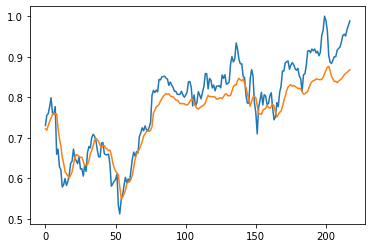

In [50]:
plt.plot(testy)
plt.plot(testpredict)

In [55]:
print(scaler.transform(testpredict))

ValueError: non-broadcastable output operand with shape (218,1) doesn't match the broadcast shape (218,5)

In [53]:
scaler.transform(testy)

ValueError: non-broadcastable output operand with shape (218,1) doesn't match the broadcast shape (218,5)